<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '2'
#https://drive.google.com/file/d/1qjzV7o5b9-mpiSLSA5U7fcLRBeouj7Z3/view?usp=sharing

In [12]:
import json
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import h5py

import sys

%matplotlib inline

In [ ]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
!{sys.executable} -m pip install h5py tqdm gdown

In [9]:
#!gdown https://drive.google.com/uc?id=1e9NQ-PMDltz7caE6xJYMci-LM0rGuz36
!unzip attention.zip
#!rm -r attention.zip

Access denied with the following error:

 	Too many users have viewed or downloaded this file recently. Please
	try accessing the file again later. If the file you are trying to
	access is particularly large or is shared with many people, it may
	take up to 24 hours to be able to view or download the file. If you
	still can't access a file after 24 hours, contact your domain
	administrator. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1e9NQ-PMDltz7caE6xJYMci-LM0rGuz36 

unzip:  cannot find or open attention.zip, attention.zip.zip or attention.zip.ZIP.
rm: cannot remove 'attention.zip': No such file or directory


## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://drive.google.com/file/d/1NLtoLqZzeES_flgs9kmmeZD_tsCTenH1/view?usp=sharing).

Please either download data from [here](https://drive.google.com/file/d/1e9NQ-PMDltz7caE6xJYMci-LM0rGuz36/view?usp=drive_link) or generate it manually using the above script.

In [14]:
f = h5py.File('./attention/img_codes.hdf5', 'r')
img_codes = f['data']

In [15]:
captions = json.load(open('./attention/captions_tokenized.json'))

In [16]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [17]:
print(len(captions))
print(len(img_codes))

118272
118287


In [18]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i]
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts.

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [19]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

#Compute word frequencies for each word in captions. See code above for data structure
for cap in captions: 
    for sent in cap:
        for word in sent:
            word_counts[word] += 1

In [20]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [292]:
n_tokens

10403

In [21]:
print(pad_ix)

3


In [21]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))

    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix

    return matrix

In [22]:
#try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   14,  287,  141,   14, 1130,  256,   62,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,  287,   62,   14, 1130,  256,  141,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,   90,  141,   14, 1291,   62,   44,    5,   14, 1287,
          13,    2,    3],
       [   1,   14, 1238, 1370,   14, 1291,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  342,  141,   14, 1291,   62,   14,
        1287,   13,    2]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part.

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [10]:
!nvidia-smi

Mon Oct 16 21:26:58 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.172.01   Driver Version: 450.172.01   CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM3...  Off  | 00000000:05:00.0 Off |                  Off |
| N/A   31C    P0    64W / 350W |  17645MiB / 32510MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla V100-SXM3...  Off  | 00000000:06:00.0 Off |                    0 |
| N/A   

In [12]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [159]:
import math
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        return torch.bmm(queries, keys.permute(0, 2, 1))/math.sqrt(keys.shape[-1])

Test for ScaledDotProductScore

In [14]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

Tests for Attention layer

In [169]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        #print(queries.shape, keys.shape, values.shape)
        if len(queries.shape) == 2:
            queries = queries.unsqueeze(1)
            
        scores = self.scorer(queries, keys)
        weights = torch.exp(scores - torch.log(torch.sum(torch.exp(scores), dim=2, keepdims=True)))
        self.attention_map = weights.detach()
        
        return torch.bmm(weights, values)

In [162]:
attn = Attention(ScaledDotProductScore())

In [163]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [164]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.attention_map).sum() == 0
assert torch.isnan(a).sum() == 0

In [165]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.attention_map)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [226]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()
        self.n_tokens     = n_tokens
        self.emb_size     = emb_size
        self.lstm_units   = lstm_units
        self.cnn_channels = cnn_channels
        # a layer that converts conv features to
        self.cnn_to_h0 = nn.Linear(in_features=cnn_channels, out_features=lstm_units, bias=True)
        self.cnn_to_c0 = nn.Linear(in_features=cnn_channels, out_features=lstm_units, bias=True)

        # recurrent part, please create the layers as per scheme above.
        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(num_embeddings=n_tokens, embedding_dim=emb_size)

        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore())

        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(in_features=cnn_channels, out_features=lstm_units, bias=True)

        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = torch.nn.LSTMCell(input_size=emb_size+cnn_channels, hidden_size=lstm_units, bias=True)        

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = nn.Linear(in_features=lstm_units+cnn_channels+emb_size, out_features=n_tokens)

    def forward(self, image_features, captions_ix):
        """
        Apply the network in training mode.
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i].
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        # 2. In the recurrent loop over tokens:
        #   2.1. transform image vectors to the keys for attention
        #   2.2. use previous lstm state as an attention query and image vectors as values
        #   2.3. apply attention to obtain context vector
        #   2.4. store attention map
        #   2.5. feed lstm with current token embedding concatenated with context vector
        #   2.6. update lstm hidden and cell vectors
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))
        #print('c shape = ', initial_cell.shape, 'h shape = ', initial_hid.shape)
        image_features = image_features.transpose(1, 2)
        keys = self.cnn_to_attn_key(image_features)
        #print('keys shape = ', keys.shape)
        # compute embeddings for captions_ix
        captions_emb = self.emb(captions_ix)
        #print('captions_emb shape =', captions_emb.shape)

        ## Предварительные танцы с бубном (первый шаг)
        attention = self.attention.forward(queries=initial_cell, keys=keys, values=image_features) # берем первый аттеншен 
        attentions_maps = self.attention.attention_map # запоминаем первый аттеншен map
        input = torch.concat([captions_emb[:, 0], attention.squeeze(1)], dim=1) # соединили эмбеддинг и attention map
        h, c = self.lstm(input, (initial_hid, initial_cell)) # lstm сделала шаг
        logits = self.logits_mlp(torch.concatenate([attention, captions_emb[:, 0].unsqueeze(1), h.unsqueeze(1)], dim=2))
        # повторяем всё тоже самое
        for i in range(1, captions_ix.shape[1]):
            attention = self.attention(queries=h, keys=keys, values=image_features) 
            attentions_maps = torch.concat([attentions_maps, self.attention.attention_map], dim=1)
            input = torch.concat([captions_emb[:, i], attention.squeeze(1)], dim=1)
            h, c = self.lstm(input, (h, c))
            tmp_logit = self.logits_mlp(torch.concatenate([attention, captions_emb[:, i].unsqueeze(1), h.unsqueeze(1)], dim=2))
            logits = torch.concat([logits, tmp_logit], dim=1)
        
        # return logits and attention maps from (2.4)
        return logits, attentions_maps

In [227]:
network = CaptionNet(n_tokens)

In [293]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)
#print(dummy_img_vec.shape, dummy_capt_ix.shape)

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [290]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i].
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus
              attention regularizer. Scalar float tensor
    """

    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()

    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()

    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)

    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.

    logits_for_next = logits_for_next.transpose(1, 2)    
    captions_ix_next = torch.nn.functional.one_hot(captions_ix_next, num_classes=logits_for_next.shape[1])
    captions_ix_next = captions_ix_next.transpose(1, 2).float()
    entropy = torch.nn.CrossEntropyLoss() 
    loss = entropy(logits_for_next, captions_ix_next)
    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()

    return loss + regularizer

In [291]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)


* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again

* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [28]:
from importlib import reload
import trainer
reload(trainer)
None

In [29]:
model = trainer.Trainer(wandb_init=True)
model.load(' peachy-breeze-13')
model.fit()

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


Saving... Epoch[0]


Saving... Epoch[2]


Saving... Epoch[4]


KeyboardInterrupt: 

### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [7]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """

    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits

features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)
import torch
from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
#if torch.cuda.is_available():
features_net = features_net.cuda()
#features_net = nn.DataParallel(features_net)

### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [8]:
def generate_caption(image, caption_prefix = ("#START#",),
                     t=1, sample=True, max_len=100):

    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3

    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32).cuda()

    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)

    attention_maps = []

    for _ in range(max_len):

        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(model.net.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
            
        next_word_logits, cur_attention_map = model.net(input_features, prefix_ix) ####
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())

        assert len(next_word_probs.shape) == 1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs)
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [9]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))

def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

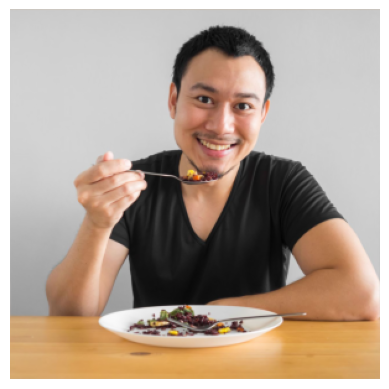

In [10]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

a man in a white shirt and a white plate with a fork and a plate of food .
a man in a white shirt and black tie
a man in a white shirt and a white plate with a fork .
a man is sitting at a table with a plate of food .
a man in a white shirt and a white plate with a fork and a plate of food .
a man is holding a plate with a fork and knife .
a man is holding a plate of food with a fork .
a man with a shirt and a tie on a plate .
a man in a white shirt and a white plate holding a fork and knife .
a man in a white shirt and a white plate holding a fork and knife .


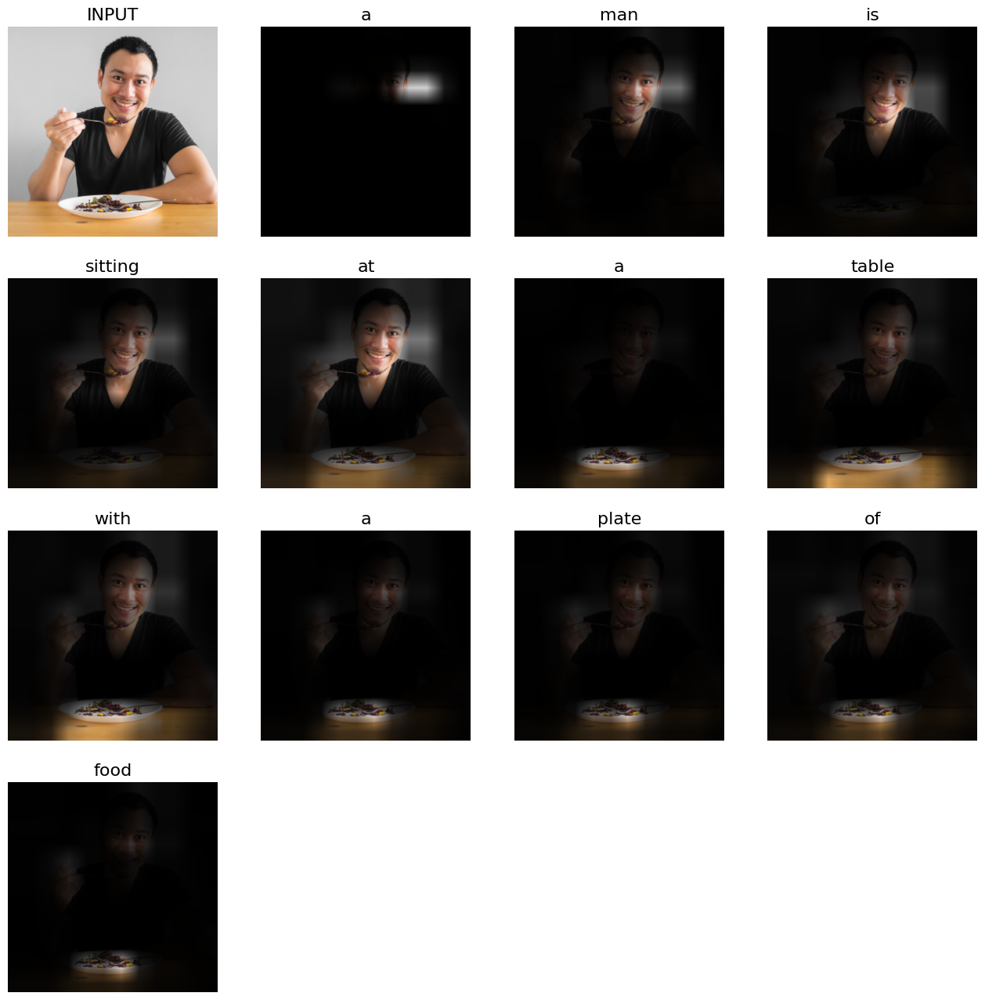

In [30]:
process_image(img)

a cat laying on top of a wooden table .
a cat laying on top of a wooden table .
a cat that is laying down on a couch
a cat laying on a wooden chair next to a cat .
a cat laying on a black and white cat looking at the camera .
a cat laying on a bench next to a dog
a cat laying on a couch with a cat .
a cat laying on a wooden surface next to a black cat .
a cat laying on top of a wooden table .
a cat laying on a couch with a cat .


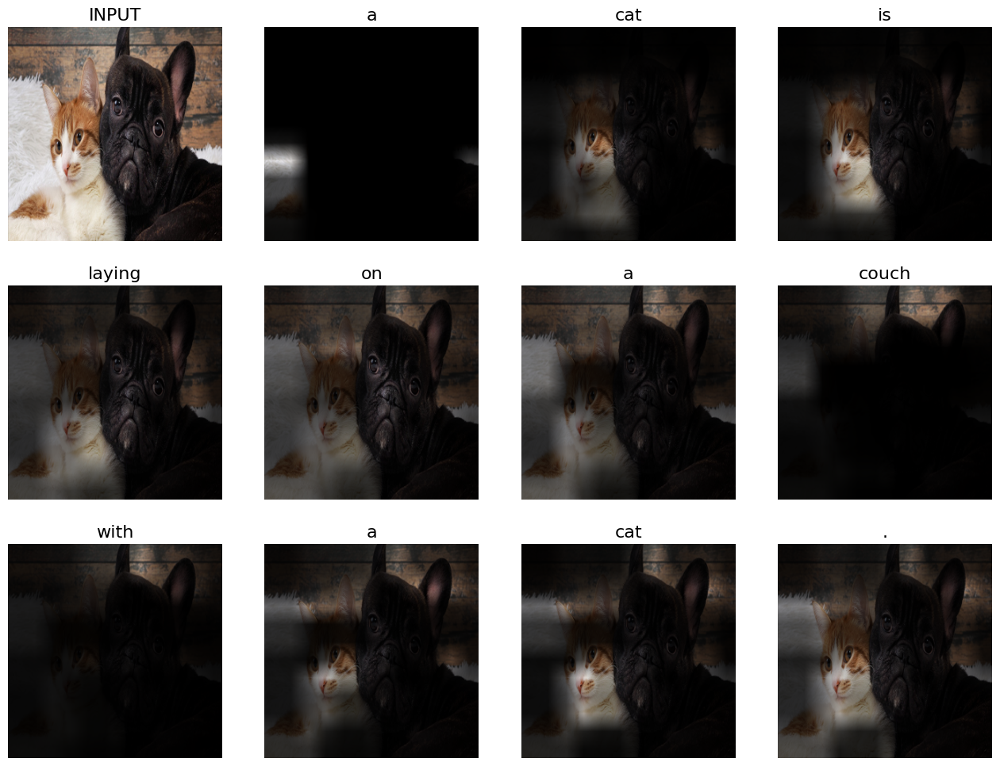

In [31]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man riding a skateboard up the side of a ramp .
a man riding a skateboard up the side of a ramp .
a man riding a skateboard down a ramp .
a man riding a skateboard up the side of a ramp .
a skateboarder is doing a trick in the air .
a man riding a skateboard down a ramp .
a man is doing a trick on a skateboard
a skateboarder is jumping over a ramp with his skateboard .
a skateboarder is doing a trick in the air .
a man riding a skateboard down a street .


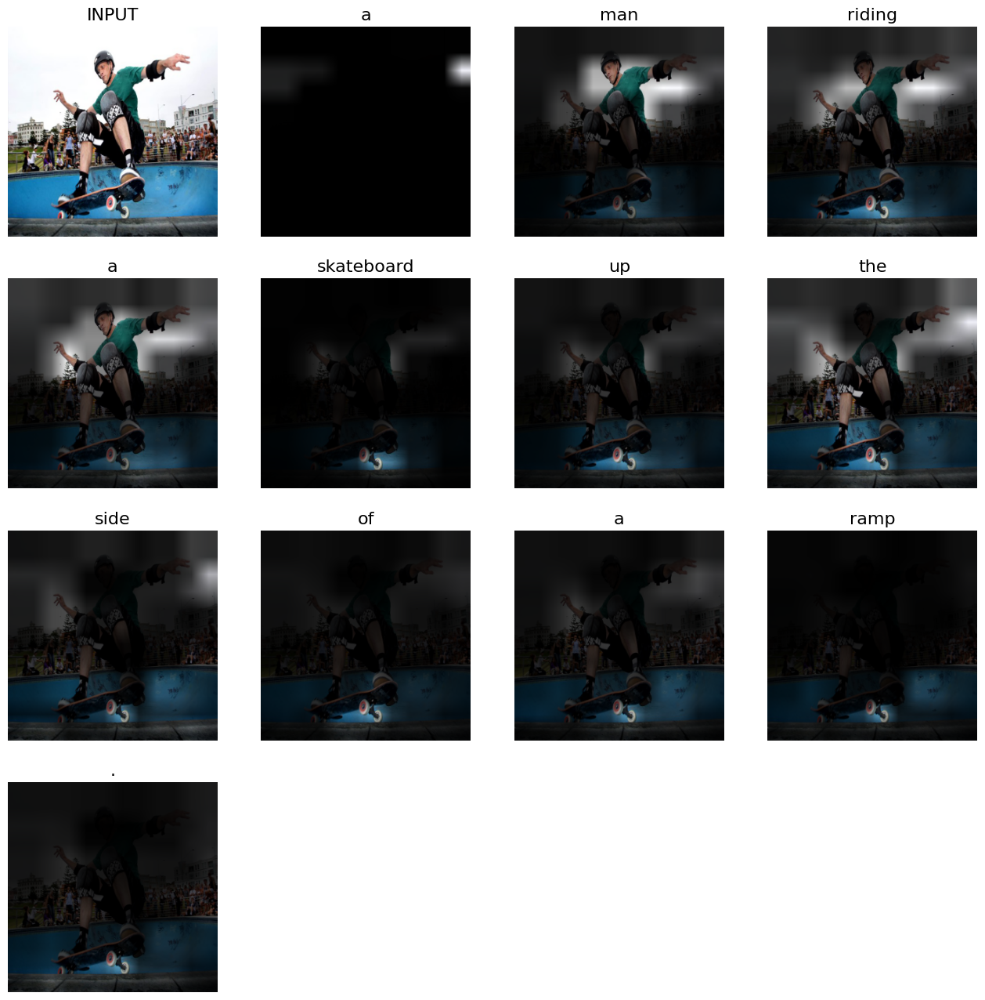

In [33]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

#### Examples of images

a group of people sitting at a table with laptops .
a group of people sitting around a table .
a group of people sitting around a table .
a group of people sitting around a table with a laptop .
a group of people sitting at a table with a laptop .
a group of people sitting at a table with a laptop .
a group of people sitting around a table with a laptop .
a group of people sitting at a table with laptops .
a group of people sitting at a table with a laptop .
a group of people sitting around a table .


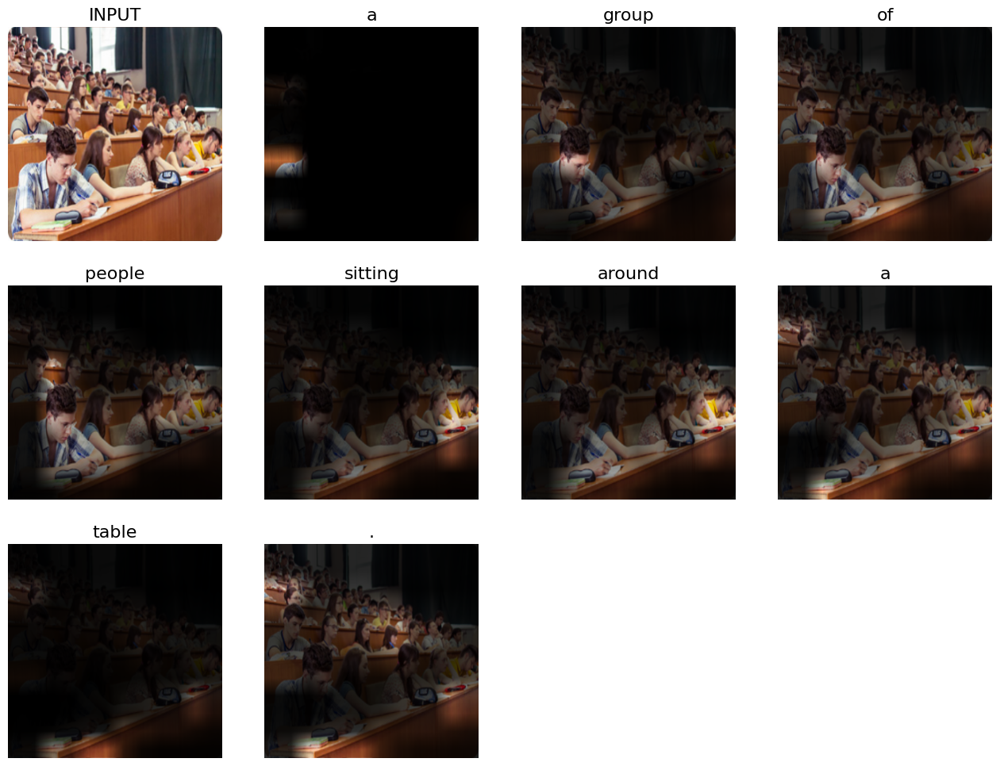

In [35]:
process_image(obtain_image(url="https://mipt.ru/abiturs/menu_image.jpg"))

a large building with a clock on the front of it .
a large building with a clock on the top .
a large building with a clock on the front of it .
a large building with a clock on the top .
a large building with a clock on the front of it .
a large building with a clock on the front of it .
a large building with a clock on the front of it .
a large building with a clock on the front of it .
a large building with a clock on it
a large building with a clock on the front of it .


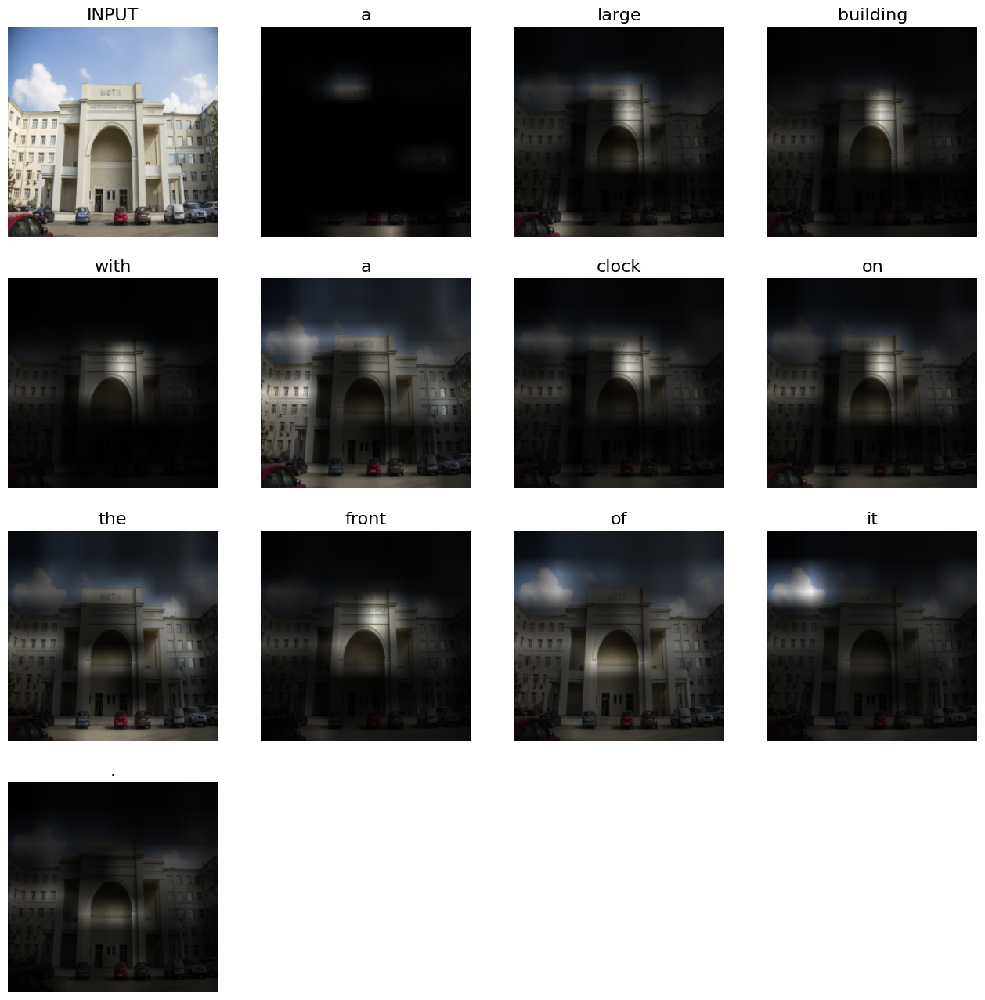

In [36]:
process_image(obtain_image(url="https://smapse.ru/storage/2018/10/lk.jpg"))

a group of people sitting on a bench .
a group of people sitting on a bench
a group of people sitting on a bench .
a group of people sitting around a table .
a group of people sitting on a bench .
a group of people sitting at a table with a laptop .
a group of people sitting around a table .
a group of people sitting on a bench .
a group of people sitting on a bench
a group of people sitting around a table .


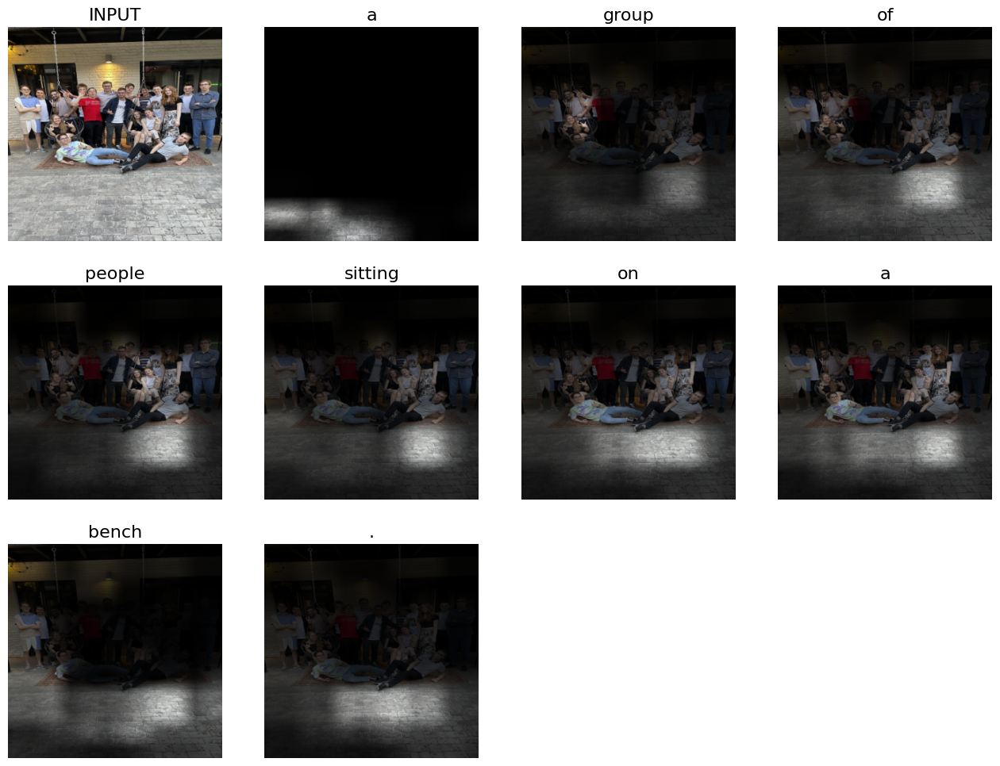

In [37]:
process_image(obtain_image(filename="iad.jpg"))

a man is standing in front of a bus .
a man in a suit is standing in front of a bus .
a man is standing in front of a bus .
a man is standing in front of a bus .
a man is standing in front of a tv .
a man is standing in front of a bus .
a person is standing in front of a tv holding a camera .
a man is standing in front of a bus .
a man is standing in front of a bus .
a man is standing in front of a refrigerator .


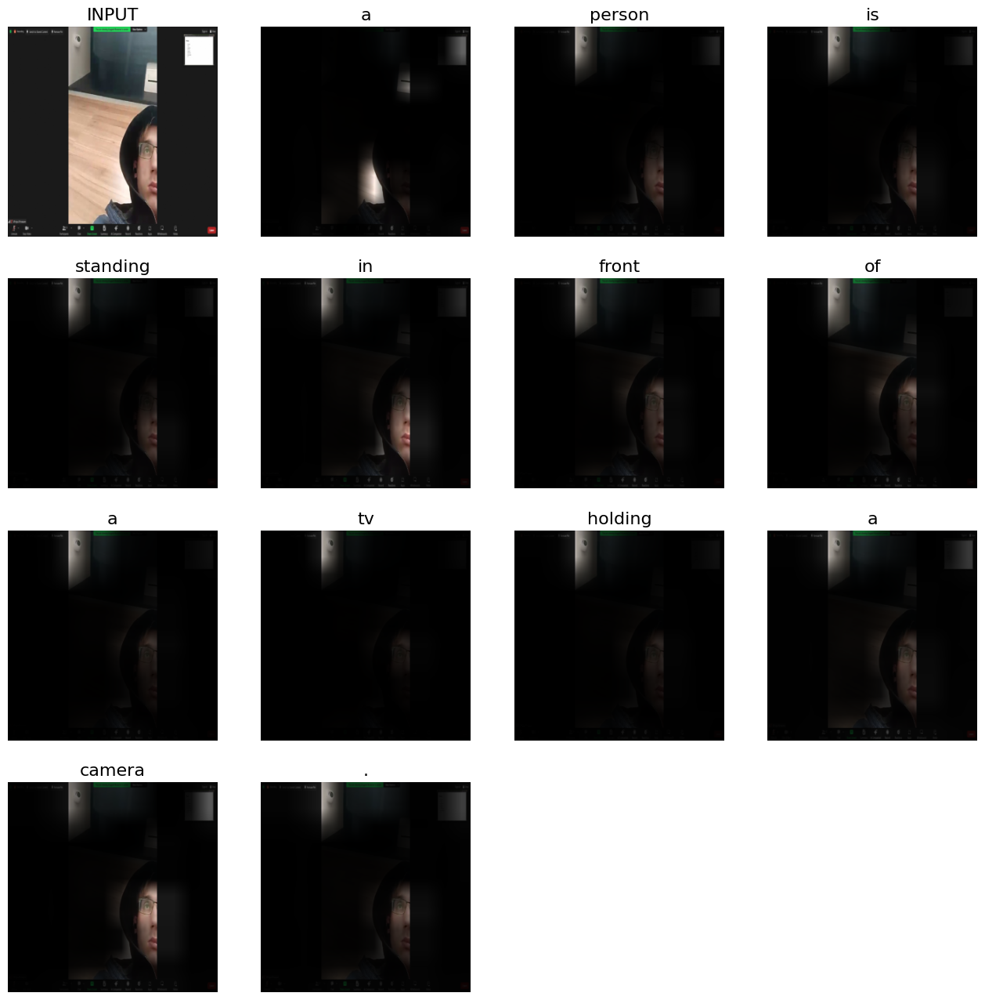

In [38]:
process_image(obtain_image(filename="igor.jpg"))

a man and a woman sitting on a bench .
a man and a woman sitting on a bench .
a man and a woman sitting on a bench .
a man and a woman are sitting on a bench .
a man and a woman are sitting on a bench .
a man and a woman sitting on a bench .
a man standing on a skateboard in front of a building .
a man and woman sitting on a bench with a dog .
a man and a woman sitting on a bench .
a man and a woman are sitting on a bench .


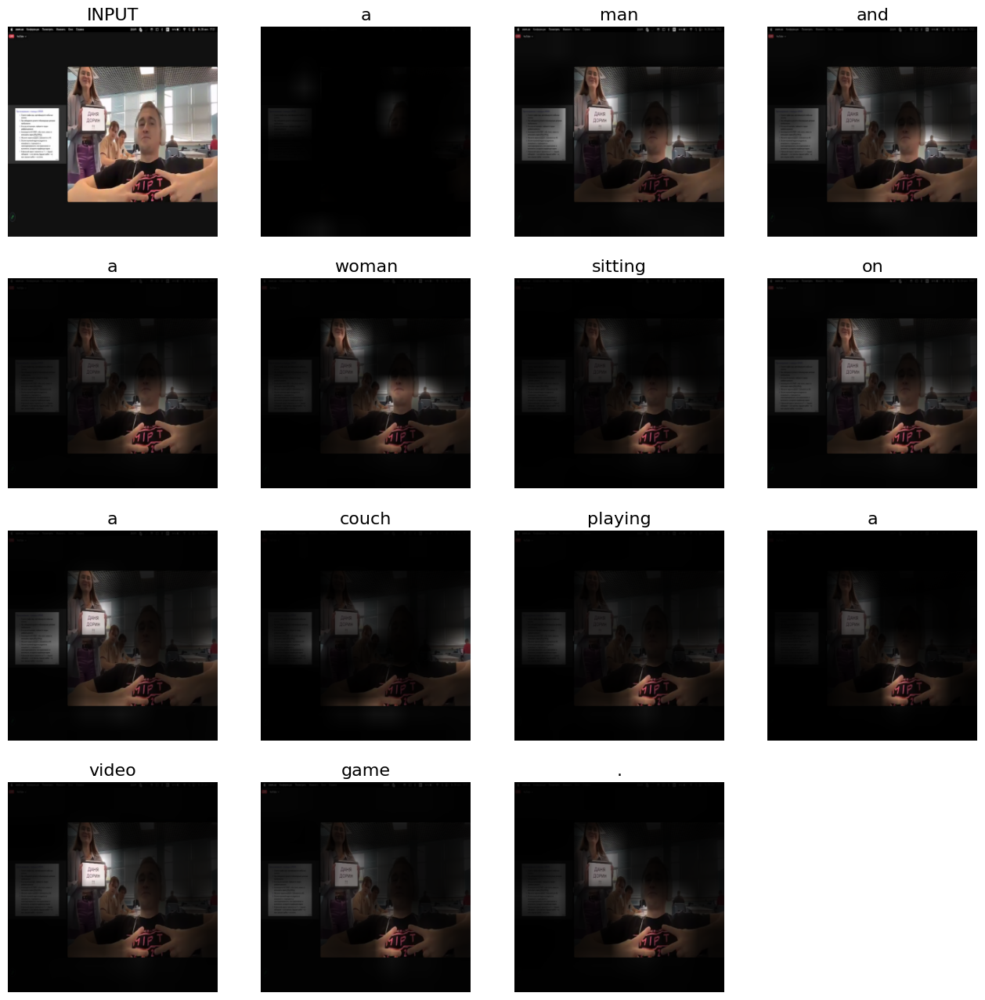

In [39]:
process_image(obtain_image(filename="liza.jpg"))

a man is holding a hot dog in front of a laptop .
a man and a woman are sitting at a table .
a man and a woman are sitting at a table .
a man and a woman are holding a baby .
a man and a woman are playing a video game
a man holding a remote control in front of a laptop .
a woman holding a smart phone in front of her computer .
a man is holding a phone in his hand .
a man holding a remote control in front of a laptop .
a man and woman holding a remote control in front of a laptop .


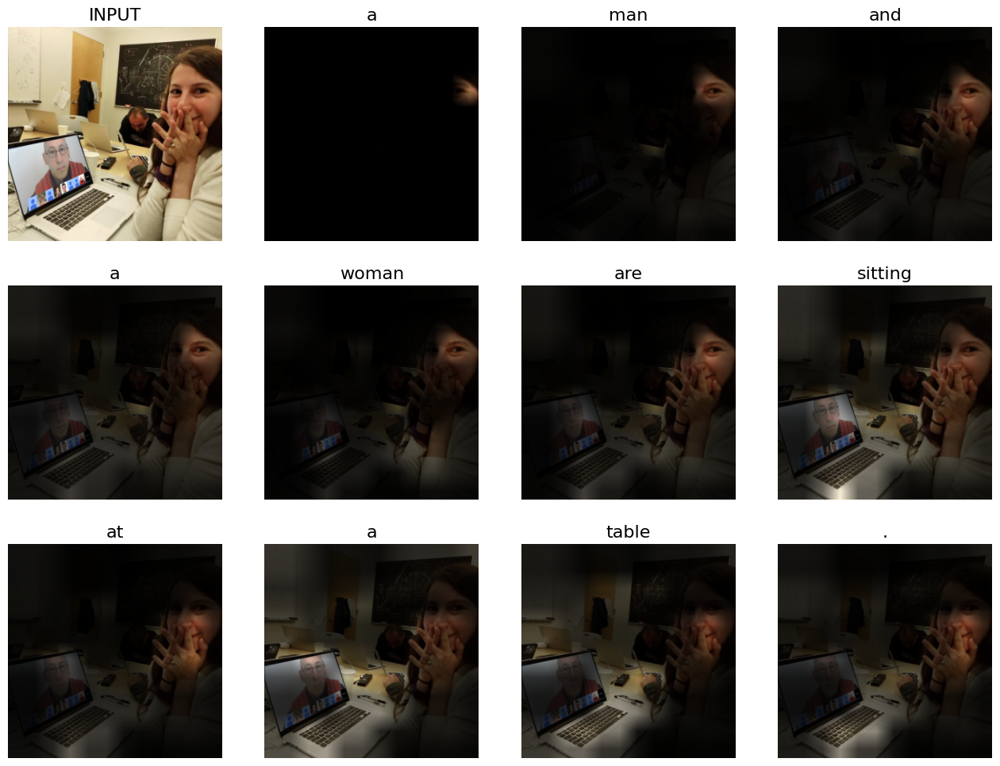

In [40]:
process_image(obtain_image(filename="strijov.jpg"))

a wall with a blue and white clock
a stop sign with graffiti on the side of it .
a stop sign with graffiti on it .
a stop sign with graffiti on it and a train on the side .
a stop sign with a green sticker on it
a stop sign with graffiti on the side of it .
a stop sign with graffiti on it on the street .
a stop sign with graffiti on it is shown .
a wall with a picture of a stop sign and a clock .
a stop sign with a white and blue sky in the background .


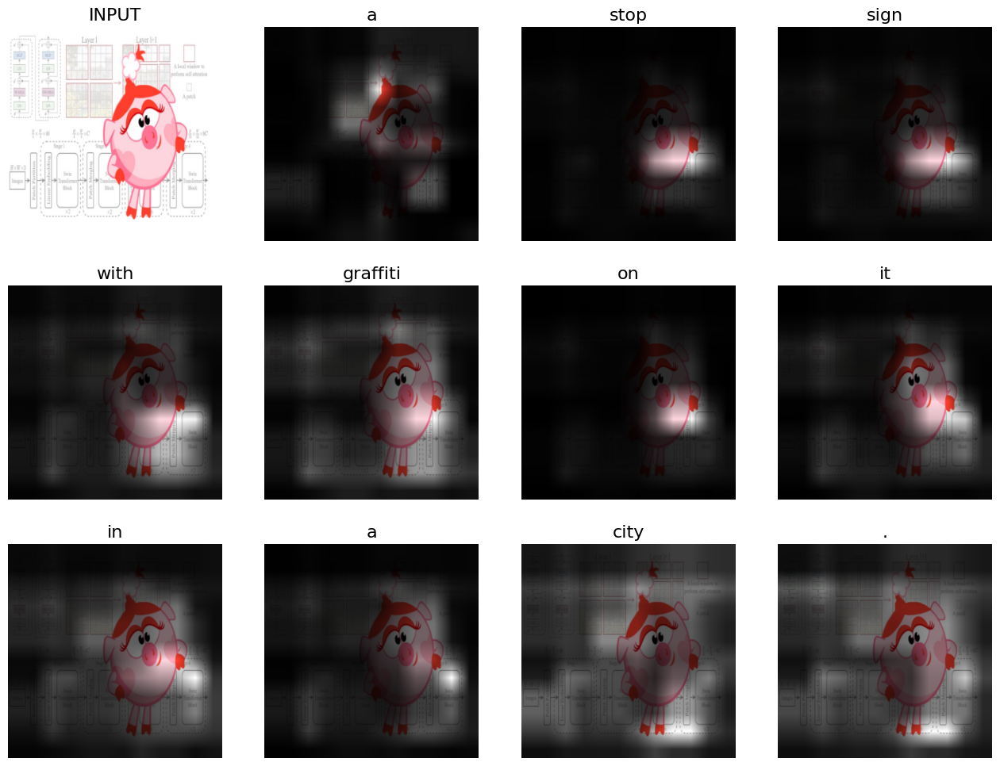

In [41]:
process_image(obtain_image(filename="swin.jpg"))

a group of people playing a game with nintendo wii controllers .
a group of people playing a video game .
a group of people playing a game with nintendo wii controllers .
a group of people playing a video game .
a picture of a man playing a video game .
a group of people playing a game with nintendo wii controllers .
a group of people playing a video game .
a group of people playing a game with nintendo wii controllers .
a group of people playing a video game .
a group of people playing a video game .


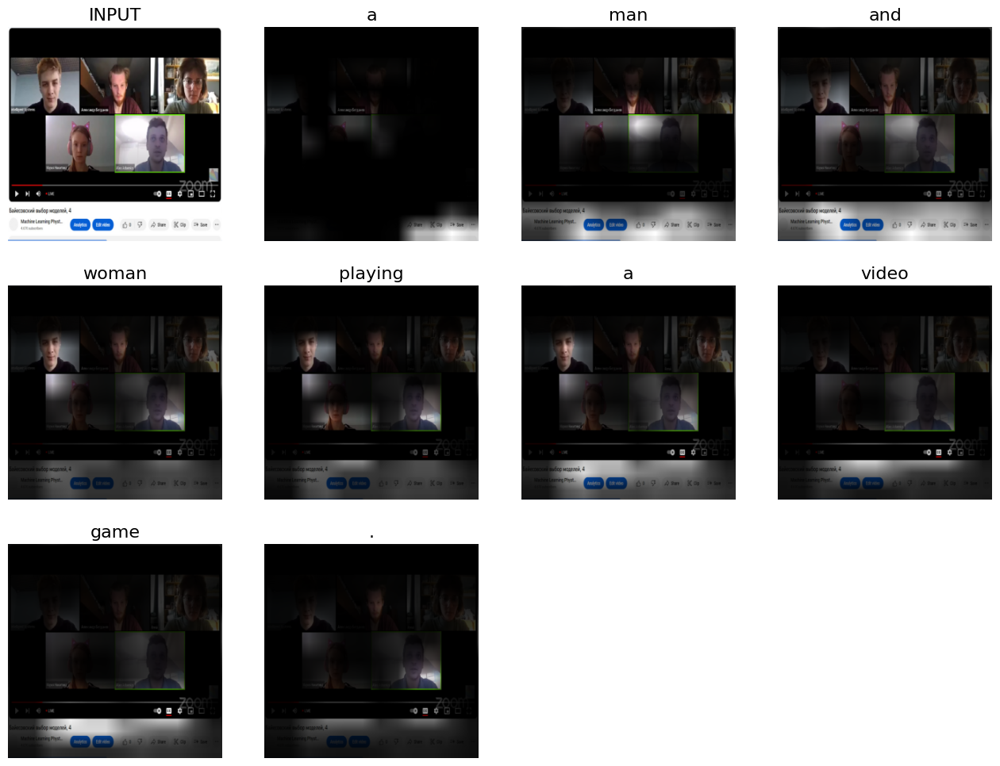

In [43]:
process_image(obtain_image(filename="aduenko.jpg"))

a man is holding a glass of wine
a man is sitting at a table with a plate of food .
a man is holding a glass of wine
a man is holding a glass of wine in his hand .
a man in a suit is cutting a piece of paper with a spoon .
a man is holding a glass of wine in his hand .
a man in a red shirt is eating a sandwich
a man is holding a glass of wine
a man is holding a glass of wine in his hand .
a man is holding a glass of wine in his hand .


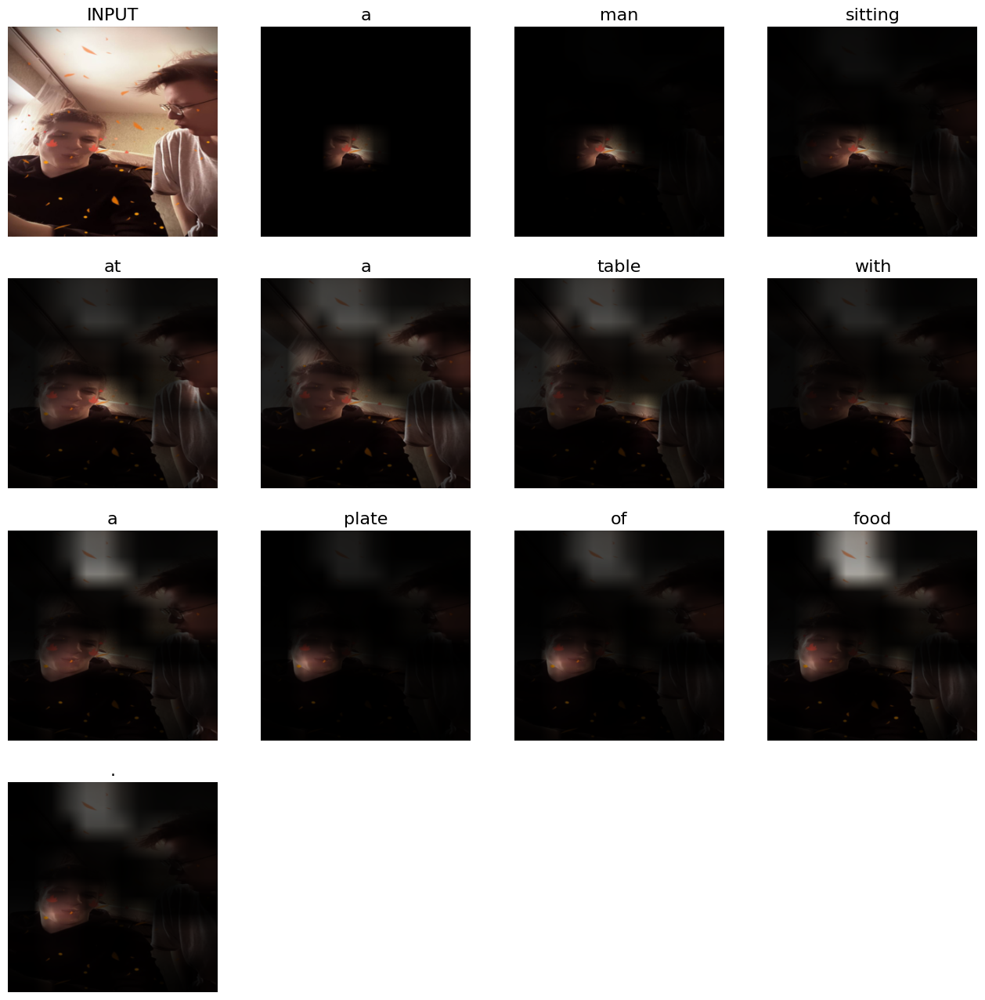

In [47]:
process_image(obtain_image(filename="volodya.jpg"))

a man with glasses and a hat on smiling .
a man in a suit is holding a cell phone .
a man in a suit is holding a cell phone .
a man with glasses and a tie in a room .
a man in a suit is holding a cell phone .
a man in a suit is holding a cell phone .
a man in a suit and tie standing in front of a christmas tree .
a man in a suit is holding a cell phone .
a man in glasses is standing in front of a mirror .
a man wearing glasses and a tie is standing in front of a christmas tree .


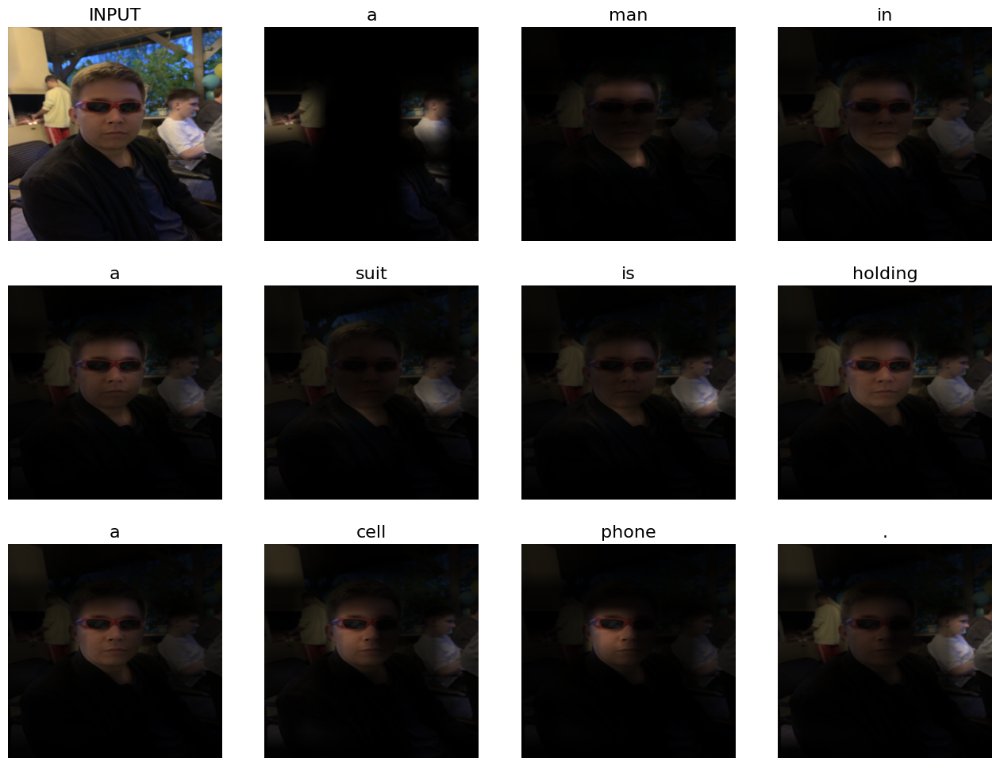

In [49]:
process_image(obtain_image(filename="andrew1.jpg"))

a man wearing a tie with a blue shirt and blue tie .
a man with a tie and a shirt .
a man wearing a shirt and tie with a smile on his face .
a man with a beard and a tie on .
a man wearing a shirt and tie with a smile .
a man wearing a tie and a shirt .
a man with a beard wearing a shirt and tie .
a man with a beard and a tie clip sits on a white wall .
a man wearing a tie and a shirt .
a man wearing a tie and a shirt .


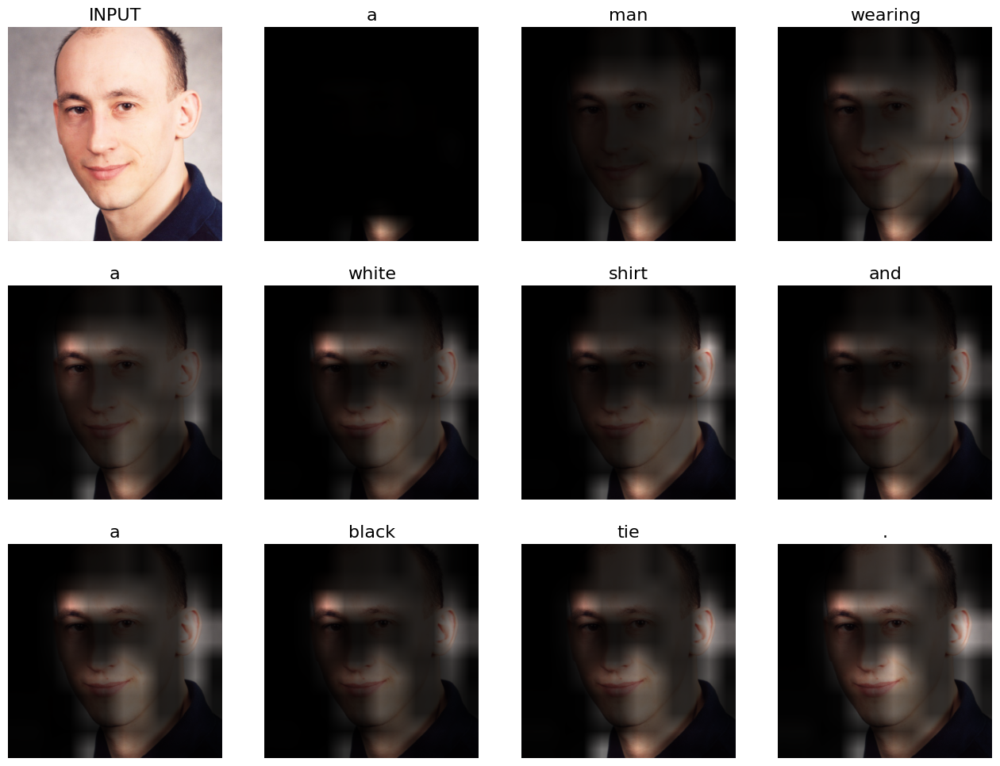

In [50]:
process_image(obtain_image(filename="vadim.jpg"))

### Conclusion
Интересный вывод можно сделать по поводу отпимизатора, здесь лучше сработал SGD, чем AdamW, хотя при обучении сверточных нейронных сетей SGD не проявлял себя никак, а AdamW очень хорошо обучал. Я увеличил следующие параметры модели: размер ембеддинга я взял 2048, размер lstm я взял 2048, также взял батч сайз размером 256, и делал большое количество итераций на одной эпохе. Сначала я обучил AdamW, потом с рестарта дообучил с помощью SGD, в качестве шедулера выступал StepLR.

Loss на тесте получился 3.07, на трейне 2.54. 
Наверное стоит загружать больше одного описания предложения.

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt).
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563